# FROSTSIM v2 — Physics-Informed Stable Diffusion Pipeline

Cleaned-up, linear version of the working pipeline: installs → model load → backgrounds → **physics-informed prompting (replaces the placeholder)** → mask/canny → generation.

## 1. Install dependencies

In [1]:
!pip install -q diffusers transformers accelerate controlnet_aux safetensors
!pip install -q opencv-python-headless datasets


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.4/290.4 kB 8.8 MB/s eta 0:00:00


## 2. Imports and device check

In [2]:
import os, gc
import numpy as np
import torch
from PIL import Image, ImageDraw
import cv2
from diffusers import (
    StableDiffusionControlNetInpaintPipeline,
    ControlNetModel, UniPCMultistepScheduler,
)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)


Using device: cuda


## 3. Load Stable Diffusion inpainting + ControlNet

In [3]:
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-canny",
    torch_dtype=torch.float16 if DEVICE == "cuda" else torch.float32,
)

pipe = StableDiffusionControlNetInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    controlnet=controlnet,
    torch_dtype=torch.float16 if DEVICE == "cuda" else torch.float32,
)
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to(DEVICE)
pipe.enable_attention_slicing()


/usr/local/lib/python3.13/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors: reconstructing file:   0%|          |  0.00B / 1.45GB            

diffusion_pytorch_model.safetensors: downloading bytes:           |  0.00B            

/usr/local/lib/python3.13/dist-packages/diffusers/utils/deprecation_utils.py:23: FutureWarning: `torch_dtype` is deprecated and will be removed in version 1.0.0. Please use `dtype` instead.
  deprecate("torch_dtype", "1.0.0", _TORCH_DTYPE_DEPRECATION_MESSAGE)


model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


## 4. Retrieve real background images (SKU-110K, public dataset)

In [4]:
from datasets import load_dataset
import io

BACKGROUNDS_DIR = "/content/backgrounds"
os.makedirs(BACKGROUNDS_DIR, exist_ok=True)

ds = load_dataset("Voxel51/sku110k_test", split="test", streaming=True)

count = 0
for example in ds:
    if count >= 10:
        break
    img = example["image"]
    if not isinstance(img, Image.Image):
        img = Image.open(io.BytesIO(img))
    img.convert("RGB").save(os.path.join(BACKGROUNDS_DIR, f"aisle_{count:02d}.jpg"))
    count += 1

print(f"Saved {count} background images")


README.md:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/2936 [00:00<?, ?it/s]

Saved 10 background images


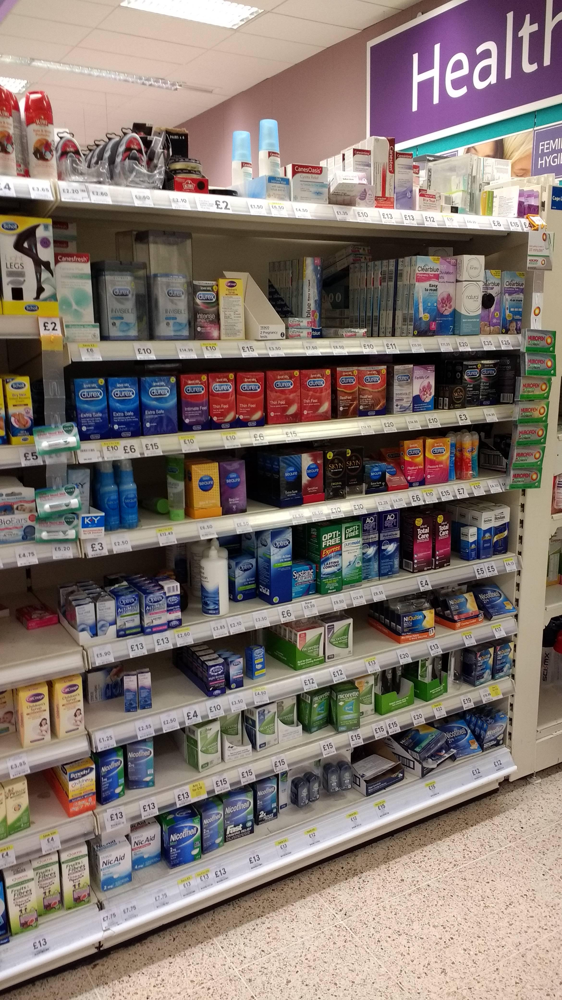

In [5]:
# quick look at a background
Image.open(os.path.join(BACKGROUNDS_DIR, "aisle_02.jpg"))


## 5. Physics engine — FROSTSIM v2 (replaces the placeholder curve)

This is the real Magnus / Newton's Law of Cooling / Beer-Lambert implementation, replacing the
old `simulate_exposure_effects()` linear ramp. It returns the same dict shape
(`condensation` / `melt` / `darkening` word buckets) plus continuous severities, and
`build_prompt_v2()` uses those continuous values for more specific prompt language.

In [6]:
# numpy >=2.0 renamed trapz -> trapezoid; keep this working on either.
_trapz = getattr(np, "trapezoid", None) or np.trapz


# ---- 1. Magnus formula: saturation vapor pressure & dew point ----
def saturation_vapor_pressure(T_c):
    T_c = np.asarray(T_c, dtype=float)
    return 6.1094 * np.exp((17.625 * T_c) / (T_c + 243.04))


def dew_point(T_c, RH_pct):
    RH = np.clip(RH_pct, 1, 100) / 100.0
    gamma = np.log(RH) + (17.625 * T_c) / (243.04 + T_c)
    return (243.04 * gamma) / (17.625 - gamma)


# ---- 2. Newton's Law of Cooling: surface temperature trajectory ----
def surface_temperature(t_min, T_initial_c=-18.0, T_ambient_c=22.0, k_per_min=0.12):
    t_min = np.asarray(t_min, dtype=float)
    return T_ambient_c + (T_initial_c - T_ambient_c) * np.exp(-k_per_min * t_min)


# ---- 3. Condensation severity ----
def condensation_severity(t_min, T_ambient_c=22.0, RH_pct=55.0, T_initial_c=-18.0,
                           k_per_min=0.12, sensitivity=0.005, dt=0.05):
    if t_min <= 0:
        return 0.0
    T_dew = dew_point(T_ambient_c, RH_pct)
    ts = np.arange(0.0, t_min + dt, dt)
    Ts = surface_temperature(ts, T_initial_c, T_ambient_c, k_per_min)
    vpd = saturation_vapor_pressure(T_ambient_c) - saturation_vapor_pressure(Ts)
    driving = np.where(Ts < T_dew, np.clip(vpd, 0, None), 0.0)
    accumulated = _trapz(driving, ts)
    severity = 1 - np.exp(-sensitivity * accumulated)
    return float(np.clip(severity, 0.0, 1.0))


# ---- 4. Frost-melt severity (thawing degree-minutes) ----
def melt_severity(t_min, T_ambient_c=22.0, T_initial_c=-18.0, k_per_min=0.12,
                   sensitivity=0.022, dt=0.05):
    if t_min <= 0:
        return 0.0
    ts = np.arange(0.0, t_min + dt, dt)
    Ts = surface_temperature(ts, T_initial_c, T_ambient_c, k_per_min)
    thaw_driving = np.clip(Ts, 0, None)
    degree_minutes = _trapz(thaw_driving, ts)
    severity = 1 - np.exp(-sensitivity * degree_minutes)
    return float(np.clip(severity, 0.0, 1.0))


# ---- 5. Darkening severity (Beer-Lambert) ----
def darkening_severity(t_min, T_ambient_c=22.0, RH_pct=55.0, T_initial_c=-18.0,
                        k_per_min=0.12, alpha=0.9):
    c = condensation_severity(t_min, T_ambient_c, RH_pct, T_initial_c, k_per_min)
    m = melt_severity(t_min, T_ambient_c, T_initial_c, k_per_min)
    l = 0.6 * c + 0.9 * m
    transmission = np.exp(-alpha * l)
    severity = 1 - transmission
    return float(np.clip(severity, 0.0, 1.0))


# ---- 6. Drop-in replacement for simulate_exposure_effects() ----
def _word(v):
    return "light" if v < 0.33 else ("moderate" if v < 0.66 else "heavy")


def simulate_exposure_effects_v2(exposure_minutes, T_ambient_c=22.0, RH_pct=55.0,
                                  T_initial_c=-18.0, k_per_min=0.12):
    c = condensation_severity(exposure_minutes, T_ambient_c, RH_pct, T_initial_c, k_per_min)
    m = melt_severity(exposure_minutes, T_ambient_c, T_initial_c, k_per_min)
    d = darkening_severity(exposure_minutes, T_ambient_c, RH_pct, T_initial_c, k_per_min)
    return {
        "condensation": _word(c),
        "melt": _word(m),
        "darkening": _word(d),
        "condensation_raw": c,
        "melt_raw": m,
        "darkening_raw": d,
        "surface_temp_c": float(surface_temperature(exposure_minutes, T_initial_c, T_ambient_c, k_per_min)),
        "dew_point_c": float(dew_point(T_ambient_c, RH_pct)),
    }


# ---- 7. Refined prompt builder ----
_CONDENSATION_PHRASES = [
    (0.15, "dry packaging, no visible condensation"),
    (0.35, "a faint sheen of condensation just starting to form"),
    (0.55, "scattered fine condensation droplets across the packaging"),
    (0.75, "dense beads of condensation running down the packaging"),
    (1.01, "heavy condensation, fully wet glistening surface with pooling droplets"),
]
_MELT_PHRASES = [
    (0.15, "frost fully intact, sharp icy edges"),
    (0.35, "frost just beginning to soften at the corners"),
    (0.55, "visible frost melt receding from the edges"),
    (0.75, "significant frost melt, ice mostly gone from visible surfaces"),
    (1.01, "frost completely melted, wet slush residue at the base"),
]
_DARKENING_PHRASES = [
    (0.15, "packaging color unchanged, crisp print"),
    (0.35, "packaging slightly dulled where damp"),
    (0.55, "cardboard visibly darkened and slightly soft where moisture soaked in"),
    (0.75, "cardboard significantly water-stained and darkened, edges softening"),
    (1.01, "cardboard heavily water-damaged, dark stains, warping, ink smearing"),
]


def _tier_phrase(v, table):
    for threshold, phrase in table:
        if v < threshold:
            return phrase
    return table[-1][1]


def build_prompt_v2(product, effects, angle="eye-level supermarket shelf photo"):
    cond_phrase = _tier_phrase(effects["condensation_raw"], _CONDENSATION_PHRASES)
    melt_phrase = _tier_phrase(effects["melt_raw"], _MELT_PHRASES)
    dark_phrase = _tier_phrase(effects["darkening_raw"], _DARKENING_PHRASES)
    return (
        f"{product} sitting on a supermarket shelf, {angle}, "
        f"{cond_phrase}, {melt_phrase}, {dark_phrase}, "
        f"realistic supermarket fluorescent lighting, shot on a phone camera, "
        f"photorealistic, high detail, natural imperfections"
    )


NEGATIVE_PROMPT_V2 = (
    "cartoon, illustration, painting, 3d render, cgi, blurry, low quality, "
    "distorted, extra objects, text, watermark, oversaturated, plastic-looking, "
    "unrealistic droplets, glossy render, studio product shot, airbrushed"
)

# sanity check
for t in [2, 10, 30]:
    eff = simulate_exposure_effects_v2(t)
    print("t={:>2}min  cond={:8s}({:.2f})  melt={:8s}({:.2f})  dark={:8s}({:.2f})".format(
        t,
        eff["condensation"], eff["condensation_raw"],
        eff["melt"], eff["melt_raw"],
        eff["darkening"], eff["darkening_raw"],
    ))


t= 2min  cond=light   (0.21)  melt=light   (0.00)  dark=light   (0.11)
t=10min  cond=moderate(0.63)  melt=moderate(0.45)  dark=moderate(0.51)
t=30min  cond=heavy   (0.68)  melt=heavy   (1.00)  dark=heavy   (0.69)


## 6. Mask, Canny edge, and resize helpers

In [7]:
def make_mask(image_size, box):
    mask = Image.new("L", image_size, 0)
    ImageDraw.Draw(mask).rectangle(box, fill=255)
    return mask


def get_canny_edges(image):
    image_np = np.array(image.convert("RGB"))
    edges = cv2.Canny(image_np, 100, 200)
    edges = np.stack([edges] * 3, axis=-1)
    return Image.fromarray(edges)


def resize_for_sd(image, max_size=768):
    w, h = image.size
    scale = max_size / max(w, h)
    new_w, new_h = int(w * scale), int(h * scale)
    new_w -= new_w % 8
    new_h -= new_h % 8
    return image.resize((new_w, new_h))


## 7. Prepare background + mask box

Box is defined as a *proportion* of the resized image (not fixed pixels), so it stays correct
regardless of the original image's resolution — this fixes the earlier `test_box` ordering bug.

In [9]:
torch.cuda.empty_cache()
gc.collect()

test_bg = Image.open(os.path.join(BACKGROUNDS_DIR, "aisle_02.jpg")).convert("RGB")
test_bg = resize_for_sd(test_bg)
w, h = test_bg.size

# top shelf area, roughly 40% wide, 25% tall
test_box = (int(w * 0.15), int(h * 0.05), int(w * 0.55), int(h * 0.30))
print("Image size:", test_bg.size, "Box:", test_box)

mask = make_mask(test_bg.size, test_box)
control_image = get_canny_edges(test_bg)


Image size: (432, 768) Box: (64, 38, 237, 230)


## 8. Build physics-informed prompt (v2) and generate

Prompt: a frozen pizza box sitting on a supermarket shelf, eye-level supermarket shelf photo, dense beads of condensation running down the packaging, significant frost melt, ice mostly gone from visible surfaces, cardboard significantly water-stained and darkened, edges softening, realistic supermarket fluorescent lighting, shot on a phone camera, photorealistic, high detail, natural imperfections


  0%|          | 0/28 [00:00<?, ?it/s]

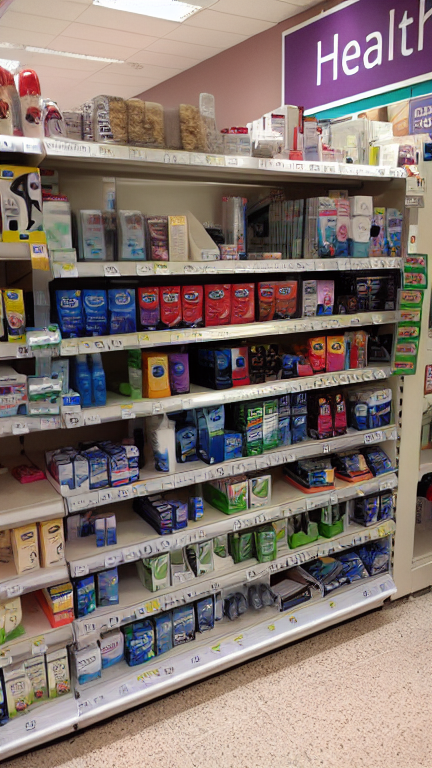

In [10]:
effects = simulate_exposure_effects_v2(12, T_ambient_c=22.0, RH_pct=55.0)
prompt = build_prompt_v2("a frozen pizza box", effects)
print("Prompt:", prompt)

result = pipe(
    prompt=prompt,
    negative_prompt=NEGATIVE_PROMPT_V2,
    image=test_bg,
    mask_image=mask,
    control_image=control_image,
    num_inference_steps=30,
    guidance_scale=7.5,
    strength=0.95,
).images[0]

result.save("/content/test_output.jpg")
result


## 9. Before / after crop comparison

Before (original):


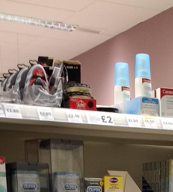

After (generated):


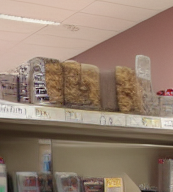

In [11]:
crop_before = test_bg.crop(test_box)
crop_after = result.crop(test_box)
print("Before (original):")
display(crop_before)
print("After (generated):")
display(crop_after)


## 10. Tuned generation — best parameters found

Lower `controlnet_conditioning_scale` (0.4–0.5) + higher `guidance_scale` (9.0) gives the model
more freedom to depart from the original product's shape, producing a more distinct generated item.

  0%|          | 0/34 [00:00<?, ?it/s]

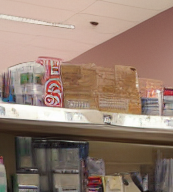

In [12]:
result_tuned = pipe(
    prompt=prompt,
    negative_prompt=NEGATIVE_PROMPT_V2,
    image=test_bg,
    mask_image=mask,
    control_image=control_image,
    num_inference_steps=35,
    guidance_scale=9.0,
    strength=0.99,
    controlnet_conditioning_scale=0.45,
).images[0]

result_tuned.save("/content/test_output_tuned.jpg")
result_tuned.crop(test_box)


[transformers] Token indices sequence length is longer than the specified maximum sequence length for this model (101 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', edges softening , realistic supermarket fluorescent lighting , shot on a phone camera , photorealistic , high detail , natural imperfections']


Prompt: a red and white frozen pizza box with a photo of a pizza on the front, frost and ice crystals on the cardboard, visible brand-style packaging design sitting on a supermarket shelf, eye-level supermarket shelf photo, dense beads of condensation running down the packaging, frost completely melted, wet slush residue at the base, cardboard significantly water-stained and darkened, edges softening, realistic supermarket fluorescent lighting, shot on a phone camera, photorealistic, high detail, natural imperfections

--- controlnet_conditioning_scale = 0.2 ---


  0%|          | 0/34 [00:00<?, ?it/s]

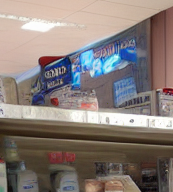

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', edges softening , realistic supermarket fluorescent lighting , shot on a phone camera , photorealistic , high detail , natural imperfections']


--- controlnet_conditioning_scale = 0.3 ---


  0%|          | 0/34 [00:00<?, ?it/s]

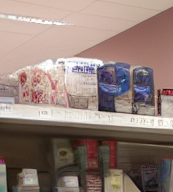

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', edges softening , realistic supermarket fluorescent lighting , shot on a phone camera , photorealistic , high detail , natural imperfections']


--- controlnet_conditioning_scale = 0.45 ---


  0%|          | 0/34 [00:00<?, ?it/s]

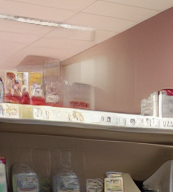

In [13]:
from IPython.display import display

# More specific product description — generic "a frozen pizza box" gives SD little to visually
# anchor on; naming visible packaging detail helps it generate something recognisable.
specific_product = (
    "a red and white frozen pizza box with a photo of a pizza on the front, "
    "frost and ice crystals on the cardboard, visible brand-style packaging design"
)

effects = simulate_exposure_effects_v2(15, T_ambient_c=22.0, RH_pct=55.0)
sweep_prompt = build_prompt_v2(specific_product, effects)
print("Prompt:", sweep_prompt)
print()

conditioning_scales = [0.2, 0.3, 0.45]

for scale in conditioning_scales:
    print(f"--- controlnet_conditioning_scale = {scale} ---")
    out = pipe(
        prompt=sweep_prompt,
        negative_prompt=NEGATIVE_PROMPT_V2,
        image=test_bg,
        mask_image=mask,
        control_image=control_image,
        num_inference_steps=35,
        guidance_scale=9.0,
        strength=0.99,
        controlnet_conditioning_scale=scale,
    ).images[0]
    display(out.crop(test_box))

Prompt: a red and white frozen pizza box, cardboard packaging, frost and ice crystals, on a supermarket shelf, heavy condensation, heavy frost melt, photorealistic

--- controlnet_conditioning_scale = 0.2 ---


  0%|          | 0/34 [00:00<?, ?it/s]

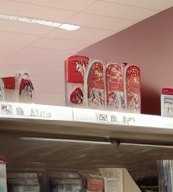

--- controlnet_conditioning_scale = 0.3 ---


  0%|          | 0/34 [00:00<?, ?it/s]

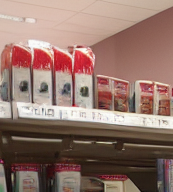

--- controlnet_conditioning_scale = 0.45 ---


  0%|          | 0/34 [00:00<?, ?it/s]

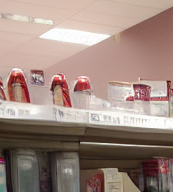

In [14]:
def get_masked_canny_edges(image, mask):
    """Canny edges with the masked region blanked out — this stops ControlNet
    from forcing the new generation to follow the *original* object's shape
    (which is what was happening: the edges of the existing toothpaste/
    deodorant boxes were being preserved regardless of conditioning_scale)."""
    edges_img = get_canny_edges(image)
    edges_np = np.array(edges_img)
    mask_np = np.array(mask)
    edges_np[mask_np > 0] = 0  # zero out edges inside the mask box
    return Image.fromarray(edges_np)


masked_control_image = get_masked_canny_edges(test_bg, mask)

# Shorter, front-loaded prompt to stay under CLIP's 77-token limit
specific_product = "a red and white frozen pizza box, cardboard packaging, frost and ice crystals"
effects = simulate_exposure_effects_v2(15, T_ambient_c=22.0, RH_pct=55.0)
sweep_prompt = f"{specific_product}, on a supermarket shelf, {effects['condensation']} condensation, {effects['melt']} frost melt, photorealistic"
print("Prompt:", sweep_prompt)
print()

conditioning_scales = [0.2, 0.3, 0.45]

for scale in conditioning_scales:
    print(f"--- controlnet_conditioning_scale = {scale} ---")
    out = pipe(
        prompt=sweep_prompt,
        negative_prompt=NEGATIVE_PROMPT_V2,
        image=test_bg,
        mask_image=mask,
        control_image=masked_control_image,
        num_inference_steps=35,
        guidance_scale=9.0,
        strength=0.99,
        controlnet_conditioning_scale=scale,
    ).images[0]
    display(out.crop(test_box))